In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import os
import mpld3
import umap
import sklearn
from sklearn.manifold import TSNE

%matplotlib inline 
mpld3.enable_notebook()

def load_data(directory):
    data = []
    for file in os.listdir(directory):
        data.append(np.load(directory+"/"+file))
    data = np.array(data)
    return data

kdata = np.load('KeplerSampleFullQ.npy',encoding='bytes')

data = load_data("full_points_final")
tt = data.reshape(2196, 784)


weird_points = [1781, 536, 1145, 533, 1720, 1328, 1156, 722, 904, 360, 124, 842, 1859, 2496, 392, 1038, 947, 2322, 156, 2138, 193, 2140, 572, 1414]
def plot_lc(emedded_mat, title):
    x = emedded_mat[:, 0]
    y = emedded_mat[:, 1]
    fig, ax = plt.subplots(subplot_kw=dict(axisbg='#EEEEEE'))
    ax.set_xlabel('feature 1')
    ax.set_ylabel('feature 2')
    N = len(x)
#     c = np.random.random(size=N)
#     print c
    hehe = []
    s = []
    for i in range(N):
        if i in weird_points:
            hehe.append(2)
            s.append(30)
        else:
            hehe.append(0)
            s.append(1)
        
    hehe = np.array(hehe)
    s = np.array(s)
    scatter = ax.scatter(x,
                         y,
                         c=hehe,
                         s=s,
                         alpha=0.3)
    ax.grid(color='white', linestyle='solid')

    ax.set_title(title, size=15)

    labels = ['point {0}'.format(i + 1) for i in range(N)]
    tooltip = mpld3.plugins.PointLabelTooltip(scatter, labels=labels)
    mpld3.plugins.connect(fig, tooltip)


In [3]:
x_embedded_tsne_first = TSNE(n_components=2, perplexity=40, learning_rate=600.0, early_exaggeration=1000.0).fit_transform(tt)

In [4]:
x_embedded_umap_first = umap.UMAP(n_neighbors=10, min_dist=1.0).fit_transform(tt)

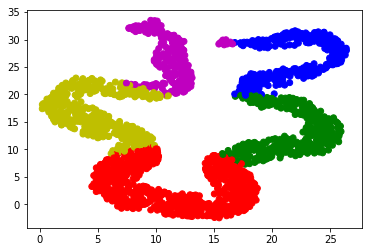

In [8]:
# k means clustering
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=5, random_state=0).fit(x_embedded_umap_first)
labels = kmeans.labels_

color_map = {0: 'r', 1: 'b', 2: 'g', 3: 'y', 4:'m'}
colors = [color_map[label] for label in labels]
x = x_embedded_umap_first[:, 0]
y = x_embedded_umap_first[:, 1]
plt.scatter(x, y, c=colors)

In [3]:
# seeing why some light curves are thrown out

dmints = [-1.2,-0.3,-0.1,-0.05, -0.02,-0.01, -0.006, -0.005, -0.004, -0.0012, 
          -0.001, -0.0006, -0.0003, 0,  0.0003, 0.0006, 0.001, 0.0012, 0.003, 
          0.004, 0.005, 0.006, 0.01, 0.02, 0.05, 0.1, 0.3, 0.6, 1.2]
dtints = [-1.0/145, 1.0/47, 2.0/47, 3.0/47, 4.0/47, 6.0/47, 10.0/47, 15.0/47,
          20.0/47, 30.0/47, 40.0/47,   1.0,   1.2,  
           1.4,  1.5, 1.7,  2, 2.25,  2.5, 3.0, 4, 6 , 9, 15, 20, 30, 45, 60, 90]

def pairwisediffs(arrayoned):
    x = arrayoned.reshape((1,len(arrayoned)))
    xdm = x[:] - np.transpose(x[:])
    xd = xdm[np.triu_indices(len(x[0]), k = 1)]
    return(xd)
def get2dhist(lightcurve):
    xd = pairwisediffs(lightcurve[0])
    yd = pairwisediffs(lightcurve[1])
    H,xe,ye = np.histogram2d(xd,yd,bins=[dtints,dmints],range=None,normed=False)
    G = 255*H/np.sum(H)
    return G


def gen_dmdt(n, dir_name):
    data = []

    if not os.path.exists(dir_name):
        os.makedirs(dir_name)
    
    normalized_x_flux = []
    normalized_y_flux = []

    temp = 0
    for i, _ in enumerate(kdata):
#         if len(kdata[i][1]) == 3534:
        normalized_x_flux.append(kdata[i][0])
        normalized_y_flux.append(kdata[i][1])
#         else:
#             fastdmdt = get2dhist([kdata[i][0],kdata[i][1]])
#             np.save(dir_name + "/" + str(temp), fastdmdt.T)
#             temp += 1
#             data.append(fastdmdt)


    nx = np.array(normalized_x_flux)
    ny = np.array(normalized_y_flux)

    print (nx.shape)
#     nx = nx[:, :n]
#     ny = ny[:, :n]

    
    temp = 0
    for i, _ in enumerate(nx):
        fastdmdt = get2dhist([nx[i],ny[i]])
        np.save(dir_name + "/" + str(i+temp), fastdmdt.T)
        data.append(fastdmdt)
                     
                              
    return np.array(data)



In [ ]:
points_30 = gen_dmdt(3534, "point_exploration")
print points_30.shape

In [16]:
true_data = points_30
true_data.shape

(2500, 28, 28)

In [18]:
reshaped_true = true_data.reshape(2500, 784)
x_embedded_tsne_true = TSNE(n_components=2, perplexity=40, learning_rate=600.0, early_exaggeration=1000.0).fit_transform(reshaped_true)
x_embedded_umap_true = umap.UMAP(n_neighbors=10, min_dist=1.0).fit_transform(reshaped_true)



In [23]:
final_data = gen_dmdt(3534, "true_points")
final_data.shape


(2500,)


(2500, 28, 28)

In [27]:
reshaped_final = final_data.reshape(2500, 784)
x_embedded_tsne_final = TSNE(n_components=2, perplexity=40, learning_rate=600.0, early_exaggeration=1000.0).fit_transform(reshaped_final)
x_embedded_umap_final = umap.UMAP(n_neighbors=10, min_dist=1.0).fit_transform(reshaped_final)



In [30]:
x_embedded_tsne_final = TSNE(n_components=2, perplexity=40, learning_rate=600.0, early_exaggeration=1000.0).fit_transform(reshaped_final)
plot_lc(x_embedded_tsne_final, "")
mpld3.display()

In [29]:
plot_lc(x_embedded_umap_final, "")
mpld3.display()

In [3]:
# trying to reduce dimensions in different ways
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import dendrogram, linkage

final_data = load_data("true_points")
reshaped_final = final_data.reshape(2500, 784)

In [4]:
z = linkage(reshaped_final, 'ward')

In [5]:
z.shape

(2499, 4)

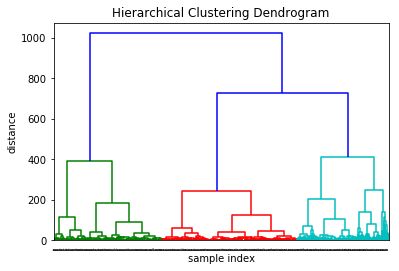

In [7]:
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(
    z,
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=1.,  # font size for the x axis labels
)
plt.show()

In [25]:
plt.figure(figsize=(200,100))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('light curve index', fontdict={'size':250})
plt.ylabel('distance', fontdict={'size':250})
dendrogram(
    z,
    leaf_rotation=90.,  # rotates the x axis labels
)
plt.savefig("dendogram/dendogram_8.eps", format='eps', dpi=1500)

In [26]:
x_embedded_tsne_1 = TSNE(n_components=2, perplexity=40, learning_rate=600.0, early_exaggeration=1000.0).fit_transform(reshaped_final)
z = linkage(x_embedded_tsne_1, 'ward')

plt.figure(figsize=(200,100))
plt.title('Hierarchical Clustering Dendrogram: 748 -> 2')
plt.xlabel('light curve index', fontdict={'size':250})
plt.ylabel('distance', fontdict={'size':250})
dendrogram(
    z,
    leaf_rotation=90.,  # rotates the x axis labels
)
plt.savefig("dendogram/final_dendograms/dendogram_784_2.eps", format='eps', dpi=1500)

In [27]:
x_embedded_tsne_2 = TSNE(n_components=30, perplexity=40, learning_rate=600.0, early_exaggeration=1000.0, method='exact').fit_transform(reshaped_final)
z = linkage(x_embedded_tsne_2, 'ward')

plt.figure(figsize=(200,100))
plt.title('Hierarchical Clustering Dendrogram: 784 -> 30')
plt.xlabel('light curve index', fontdict={'size':250})
plt.ylabel('distance', fontdict={'size':250})
dendrogram(
    z,
    leaf_rotation=90.,  # rotates the x axis labels
)
plt.savefig("dendogram/final_dendograms/dendogram_784_30.eps", format='eps', dpi=1500)


x_embedded_tsne_3 = TSNE(n_components=4, perplexity=40, learning_rate=600.0, early_exaggeration=1000.0, method='exact').fit_transform(x_embedded_tsne_2)
z = linkage(x_embedded_tsne_3, 'ward')

plt.figure(figsize=(200,100))
plt.title('Hierarchical Clustering Dendrogram: 784 -> 30 -> 4')
plt.xlabel('light curve index', fontdict={'size':250})
plt.ylabel('distance', fontdict={'size':250})
dendrogram(
    z,
    leaf_rotation=90.,  # rotates the x axis labels
)
plt.savefig("dendogram/final_dendograms/dendogram_784_30_4.eps", format='eps', dpi=1500)


x_embedded_tsne_4 = TSNE(n_components=2, perplexity=40, learning_rate=600.0, early_exaggeration=1000.0).fit_transform(x_embedded_tsne_3)
z = linkage(x_embedded_tsne_4, 'ward')

plt.figure(figsize=(200,100))
plt.title('Hierarchical Clustering Dendrogram: 784 -> 30 -> 4 -> 2')
plt.xlabel('light curve index', fontdict={'size':250})
plt.ylabel('distance', fontdict={'size':250})
dendrogram(
    z,
    leaf_rotation=90.,  # rotates the x axis labels
)
plt.savefig("dendogram/final_dendograms/dendogram_784_30_4_2.eps", format='eps', dpi=1500)



In [28]:
x_embedded_tsne_5 = TSNE(n_components=4, perplexity=40, learning_rate=600.0, early_exaggeration=1000.0, method='exact').fit_transform(reshaped_final)
z = linkage(x_embedded_tsne_5, 'ward')

plt.figure(figsize=(200,100))
plt.title('Hierarchical Clustering Dendrogram: 784 -> 4')
plt.xlabel('light curve index', fontdict={'size':250})
plt.ylabel('distance', fontdict={'size':250})
dendrogram(
    z,
    leaf_rotation=90.,  # rotates the x axis labels
)
plt.savefig("dendogram/final_dendograms/dendogram_784_4.eps", format='eps', dpi=1500)

x_embedded_tsne_6 = TSNE(n_components=2, perplexity=40, learning_rate=600.0, early_exaggeration=1000.0).fit_transform(x_embedded_tsne_5)
z = linkage(x_embedded_tsne_6, 'ward')

plt.figure(figsize=(200,100))
plt.title('Hierarchical Clustering Dendrogram: 784 -> 4 -> 2')
plt.xlabel('light curve index', fontdict={'size':250})
plt.ylabel('distance', fontdict={'size':250})
dendrogram(
    z,
    leaf_rotation=90.,  # rotates the x axis labels
)
plt.savefig("dendogram/final_dendograms/dendogram_784_4_2.eps", format='eps', dpi=1500)


